In [1]:
import os, sys, glob
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Conv2D, Conv2DTranspose, MaxPooling2D,
    BatchNormalization, Dropout, concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
)
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, auc, precision_recall_curve, average_precision_score
)
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

In [2]:
# Config
TRAINING_DIR   = os.path.join("..", "..", "training")
IMAGES_DIR     = os.path.join(TRAINING_DIR, "images")
TARGETS_DIR    = os.path.join(TRAINING_DIR, "targets")
MODEL_OUTPUT   = "model_sdss.h5"
CHECKPOINT_DIR = "checkpoints"
IMG_SIZE       = (256, 256)
BATCH_SIZE     = 4
EPOCHS         = 15
LEARNING_RATE  = 1e-4
VAL_SPLIT      = 0.15
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs("backup", exist_ok=True)
print(f"TensorFlow : {tf.__version__}")
print(f"GPU        : {tf.config.list_physical_devices('GPU')}")
print(f"Training   : {os.path.abspath(IMAGES_DIR)}")
print(f"Output     : {os.path.abspath(MODEL_OUTPUT)}")

TensorFlow : 2.13.0
GPU        : []
Training   : c:\Users\Jason Lee\Documents\Binus\Thesis S2\Code\training\images
Output     : c:\Users\Jason Lee\Documents\Binus\Thesis S2\Code\backend\model\model_sdss.h5


In [3]:
import re

In [4]:
def find_latest_checkpoint(checkpoint_dir):
    files = glob.glob(os.path.join(checkpoint_dir, "epoch_*.h5"))
    if not files:
        return None, 0
    # Ekstrak nomor epoch dari nama file: epoch_04_dice_0.1234.h5
    def extract_epoch(f):
        m = re.search(r"epoch_(\d+)", os.path.basename(f))
        return int(m.group(1)) if m else 0
    latest = max(files, key=extract_epoch)
    epoch_num = extract_epoch(latest)
    return latest, epoch_num

In [5]:
RESUME_CHECKPOINT, RESUME_EPOCH = find_latest_checkpoint(CHECKPOINT_DIR)
if RESUME_CHECKPOINT:
    print(f"Checkpoint ditemukan  : {RESUME_CHECKPOINT}")
    print(f"Lanjut dari epoch     : {RESUME_EPOCH + 1}")
else:
    print("Tidak ada checkpoint — mulai dari epoch 1")

Checkpoint ditemukan  : checkpoints\epoch_14_dice_0.4488.h5
Lanjut dari epoch     : 15


In [6]:
# Dice loss function - > for handling imbalanced datasets where certain regions dominate.
def dice_loss(y_true, y_pred, smooth=1.0):
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (
        tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth
    )

In [7]:
# Binary Cross-Entropy Dice Loss (BCE Dice Loss)
# -> loss benefits from pixel-level accuracy 
# -> and region-level overlap, improving convergence and segmentation quality.
def weighted_bce_dice_loss(y_true, y_pred):
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)

    weights = tf.where(
        tf.equal(y_true_f, 1.0),
        tf.constant(15.0),
        tf.constant(1.0)
    )

    bce = -(y_true_f * tf.math.log(y_pred) + (1 - y_true_f) * tf.math.log(1 - y_pred))

    weighted_bce = tf.reduce_mean(bce * weights)

    return weighted_bce + dice_loss(y_true, y_pred)


In [8]:
def focal_loss(y_true, y_pred, alpha=0.75, gamma=2.0):
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
    
    pt = tf.where(tf.equal(y_true_f, 1.0), y_pred, 1 - y_pred)
    alpha_t = tf.where(tf.equal(y_true_f, 1.0), alpha, 1 - alpha)
    
    focal = -alpha_t * tf.pow(1 - pt, gamma) * tf.math.log(pt)
    return tf.reduce_mean(focal)

In [9]:
def combined_loss(y_true, y_pred):
    return focal_loss(y_true, y_pred) + dice_loss(y_true, y_pred)

In [10]:
def dice_coef(y_true, y_pred, smooth=1.0):
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth
    )

In [11]:
from keras.src.layers.core import activation
# Modelling -> Resnet50-Unet
# Input (Encoder)
encoder = ResNet50(weights="imagenet", include_top=False, input_shape=(256, 256, 3))

# Ambil output tiap level untuk skip connection
skip1 = encoder.get_layer("conv1_relu").output          # 128×128, 64ch
skip2 = encoder.get_layer("conv2_block3_out").output    # 64×64,  256ch
skip3 = encoder.get_layer("conv3_block4_out").output    # 32×32,  512ch
skip4 = encoder.get_layer("conv4_block6_out").output    # 16×16, 1024ch
bridge = encoder.get_layer("conv5_block3_out").output   # 8×8,  2048ch

# Decoder Block 4 -> 8x8 -> 16x16
x = Conv2DTranspose(512, (2,2), strides=(2,2), padding="same")(bridge)
x = concatenate([x, skip4])
x = Conv2D(512, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Conv2D(512, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Decoder Block 3 -> 16x16 -> 32x32
x = Conv2DTranspose(256, (2,2), strides=(2,2), padding="same")(x)
x = concatenate([x, skip3])
x = Conv2D(256, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Conv2D(256, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Decoder Block 2 -> 32x32 -> 64x64
x = Conv2DTranspose(128, (2,2), strides=(2,2), padding="same")(x)
x = concatenate([x, skip2])
x = Conv2D(128, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Decoder Block 1 -> 64x64 -> 128x128
x = Conv2DTranspose(64, (2,2), strides=(2,2), padding="same")(x)
x = concatenate([x, skip1])
x = Conv2D(64, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3,3), activation="relu", padding="same")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Output -> 128x128 -> 256x256
x = Conv2DTranspose(32, (2,2), strides=(2,2), padding="same")(x)
x = Conv2D(32, (3,3), activation="relu", padding="same")(x)
x = Conv2D(32, (3,3), activation="relu", padding="same")(x)
x = Conv2D(1, (1,1), activation="sigmoid")(x)

In [12]:
model = Model(inputs=encoder.input, outputs=x, name='ResNet50-Unet')

In [13]:
model.summary()

Model: "ResNet50-Unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                  

In [14]:
tf.keras.utils.plot_model(
    model, 
    to_file='architecture_resnet50_unet.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=150,
    expand_nested=True
)

In [15]:
from IPython.display import Image
Image('architecture_resnet50_unet.png', width=600)

In [16]:
# Fase 1 -> Freeze Encoder, train decoder dulu
# -> commonly used in transfer learning to save computational resources and avoid 
# -> overfitting, especially when working with small datasets.
for layer in model.layers:
    if 'conv5' in layer.name or 'conv4' in layer.name:
        layer.trainable = True
    elif 'conv' in layer.name and 'batch' not in layer.name:
        layer.trainable = False

In [17]:
model.compile(optimizer=Adam(learning_rate=LEARNING_RATE), loss=combined_loss, metrics=["accuracy", dice_coef])

In [18]:
total_param = model.count_params()
train_param = sum(tf.keras.backend.count_params(w) for w in model.trainable_weights)
print("Total Params -> ", total_param)
print("Train Params -> ", train_param)
print("Freeze Encoder -> ", (total_param - train_param))

Total Params ->  41004353
Train Params ->  22088448
Freeze Encoder ->  18915905


In [19]:
def load_and_preprocess(img_path, mask_path):
    img_path = img_path.numpy().decode('utf-8')
    mask_path = mask_path.numpy().decode('utf-8')
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE).astype(np.float32) / 255.0
    
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    mask = (mask > 0).astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)
    return img, mask

In [20]:
def tf_load(img_path, mask_path):
    img, mask = tf.py_function(
        load_and_preprocess, [img_path, mask_path],
        [tf.float32, tf.float32]
    )
    img.set_shape([*IMG_SIZE, 3])
    mask.set_shape([*IMG_SIZE, 1])
    return img, mask

In [21]:
@tf.function
def augment(img, mask):
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_up_down(img)
        mask = tf.image.flip_up_down(mask)
    if tf.random.uniform(()) > 0.5:
        k = tf.random.uniform((), minval=1, maxval=4, dtype=tf.int32)
        img = tf.image.rot90(img, k)
        mask = tf.image.rot90(mask, k)
    return img, mask

In [22]:
post_images = sorted(glob.glob(os.path.join(IMAGES_DIR, "*_post_disaster.png"))) # ambil gambar post_disaster
image_paths, target_paths = [], []


In [23]:
for p in post_images:
    t  = os.path.join(TARGETS_DIR, os.path.basename(p).replace(".png", "_target.png"))
    if os.path.exists(t):
        image_paths.append(p)
        target_paths.append(t)

print("Total Valid Pair IMG -> ", len(image_paths))

Total Valid Pair IMG ->  2799


In [24]:
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths, target_paths, test_size=VAL_SPLIT, random_state=42
)

In [25]:
print(f"Train: {len(train_imgs)} | Validasi: {len(val_imgs)}")

Train: 2379 | Validasi: 420


In [26]:
dmg_total, non_dmg_total = 0, 0
scan_count = min(500, len(train_imgs))

for i in range(scan_count):
    mask = cv2.imread(train_masks[i], cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    dmg = (mask > 0).sum()
    non_dmg = mask.size - dmg
    dmg_total += dmg
    non_dmg_total += non_dmg

weight_for_0 = 1.0                                    # non-damage
weight_for_1 = non_dmg_total / (dmg_total + 1e-8)     # damage (bisa 10x-50x)
weight_for_1 = min(weight_for_1, 20.0)                # cap agar tidak terlalu ekstrem

print(f"Non-damage pixels : {non_dmg_total:>12,}")
print(f"Damage pixels     : {dmg_total:>12,}")
print(f"Rasio             : 1 : {non_dmg_total/(dmg_total+1):.1f}")
print(f"Class weight      : Non-damage={weight_for_0:.1f}, Damage={weight_for_1:.1f}")

Non-damage pixels :   30,694,345
Damage pixels     :    2,073,655
Rasio             : 1 : 14.8
Class weight      : Non-damage=1.0, Damage=14.8


In [27]:
damage_ratios = []
for i, t_path in enumerate(target_paths):
    mask = cv2.imread(t_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    ratio = (mask > 0).sum() / mask.size
    damage_ratios.append(ratio)
damage_ratios = np.array(damage_ratios)

In [28]:
# Gambar dengan damage > 5% dari total piksel = "high damage"
high_damage_idx = np.where(damage_ratios > 0.05)[0]
medium_damage_idx = np.where((damage_ratios > 0.01) & (damage_ratios <= 0.05))[0]
low_damage_idx = np.where(damage_ratios <= 0.01)[0]
print(f"High damage  (>5%)  : {len(high_damage_idx)} gambar")
print(f"Medium damage (1-5%): {len(medium_damage_idx)} gambar")
print(f"Low damage   (<1%)  : {len(low_damage_idx)} gambar")

High damage  (>5%)  : 894 gambar
Medium damage (1-5%): 609 gambar
Low damage   (<1%)  : 1296 gambar


In [29]:
# Duplikat: high damage 3x, medium damage 2x
oversampled_imgs = list(image_paths)
oversampled_masks = list(target_paths)
for idx in high_damage_idx:
    for _ in range(2):  # tambah 2 kopi (total 3x)
        oversampled_imgs.append(image_paths[idx])
        oversampled_masks.append(target_paths[idx])
for idx in medium_damage_idx:
    for _ in range(1):  # tambah 1 kopi (total 2x)
        oversampled_imgs.append(image_paths[idx])
        oversampled_masks.append(target_paths[idx])
print(f"\nSebelum oversampling: {len(image_paths)} gambar")
print(f"Sesudah oversampling: {len(oversampled_imgs)} gambar")


Sebelum oversampling: 2799 gambar
Sesudah oversampling: 5196 gambar


In [30]:
# Build Data
train_ds = (tf.data.Dataset.from_tensor_slices((oversampled_imgs, oversampled_masks))
                .shuffle(1000)
                .map(tf_load, num_parallel_calls=tf.data.AUTOTUNE)
                .map(augment, num_parallel_calls=tf.data.AUTOTUNE)
                .batch(BATCH_SIZE)
                .prefetch(tf.data.AUTOTUNE))

val_ds = (tf.data.Dataset.from_tensor_slices((val_imgs, val_masks))
          .map(tf_load, num_parallel_calls=tf.data.AUTOTUNE)
          .batch(BATCH_SIZE)
          .prefetch(tf.data.AUTOTUNE))

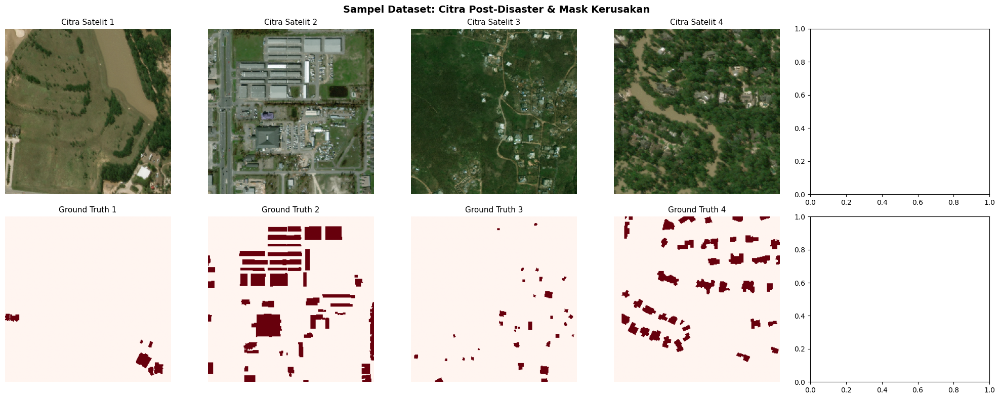

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for imgs, masks in train_ds.take(1):
    for i in range(min(5, imgs.shape[0])):
        # Normalize image ke [0,1] agar tidak hitam
        img = imgs[i].numpy()
        img = (img - img.min()) / (img.max() - img.min() + 1e-8)
        
        axs[0, i].imshow(img)
        axs[0, i].set_title(f"Citra Satelit {i+1}", fontsize=11)
        axs[0, i].axis("off")
        axs[1, i].imshow(masks[i, :, :, 0], cmap="Reds")
        axs[1, i].set_title(f"Ground Truth {i+1}", fontsize=11)
        axs[1, i].axis("off")

plt.suptitle("Sampel Dataset: Citra Post-Disaster & Mask Kerusakan",
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Sampel Dataset.png", dpi=150, bbox_inches="tight")
plt.show()

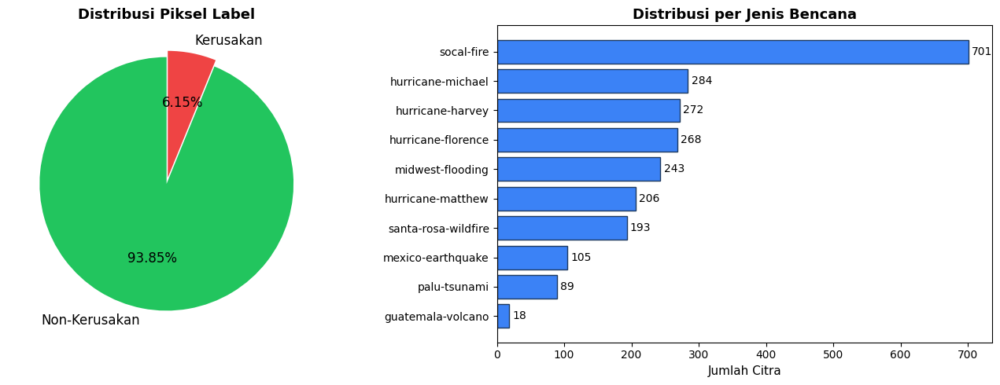

Rasio kerusakan: 6.15% | Non-kerusakan: 93.85%


In [32]:
# Hitung rasio piksel kerusakan vs non-kerusakan
damage_pixels, total_pixels = 0, 0
sample_count = min(200, len(train_imgs))

for i in range(sample_count):
    mask = cv2.imread(train_masks[i], cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    damage_pixels += (mask > 0).sum()
    total_pixels += mask.size

damage_ratio = damage_pixels / total_pixels * 100
normal_ratio = 100 - damage_ratio

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart
colors = ['#22c55e', '#ef4444']
ax1.pie([normal_ratio, damage_ratio], labels=['Non-Kerusakan', 'Kerusakan'],
        autopct='%1.2f%%', colors=colors, startangle=90,
        textprops={'fontsize': 12}, explode=(0, 0.05))
ax1.set_title('Distribusi Piksel Label', fontsize=13, fontweight='bold')

disaster_counts = {}
for p in train_imgs:
    # guatemala-volcano_00000000_post_disaster.png → guatemala-volcano
    basename = os.path.basename(p).replace('_post_disaster.png', '')
    dtype = basename.rsplit('_', 1)[0]  # buang angka di belakang
    disaster_counts[dtype] = disaster_counts.get(dtype, 0) + 1

# Urutkan dari terbanyak
disaster_counts = dict(sorted(disaster_counts.items(), key=lambda x: x[1], reverse=True))
names = list(disaster_counts.keys())
counts = list(disaster_counts.values())

bars = ax2.barh(names, counts, color='#3b82f6', edgecolor='#1e3a5f')
ax2.set_xlabel('Jumlah Citra', fontsize=11)
ax2.set_title('Distribusi per Jenis Bencana', fontsize=13, fontweight='bold')
for bar, count in zip(bars, counts):
    ax2.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
             str(count), va='center', fontsize=10)
ax2.invert_yaxis()

plt.tight_layout()
plt.savefig('Distribution_V2.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Rasio kerusakan: {damage_ratio:.2f}% | Non-kerusakan: {normal_ratio:.2f}%")

In [33]:
damage_ratio = damage_pixels / total_pixels * 100
normal_ratio = 100 - damage_ratio

In [34]:
import json

In [35]:
HISTORY_FILE = os.path.join(CHECKPOINT_DIR, "training_history.json")

In [36]:
def save_hist(hist_dict, filepath=HISTORY_FILE):
    serializable = {}
    for key, values in hist_dict.items():
        serializable[key] = [float(v) for v in values]
    with open(filepath, 'w') as f:
        json.dump(serializable, f, indent=2)
    print(f"History tersimpan ke {filepath} ({len(list(serializable.values())[0])} epoch)")

In [37]:
def load_hist(filepath=HISTORY_FILE):
    if os.path.exists(filepath):
        with open(filepath, 'r') as f:
            h = json.load(f)
        print(f"History dimuat dari {filepath} ({len(list(h.values())[0])} epoch)")
        return h
    print("Belum ada history tersimpan.")
    return {}

In [38]:
class SaveHistoryCallback(tf.keras.callbacks.Callback):
    def __init__(self, filepath=HISTORY_FILE):
        super().__init__()
        self.filepath = filepath

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            return
        
        curr = load_hist()
        
        for key, val in logs.items():
            if key not in curr:
                curr[key] = []
            curr[key].append(float(val))
        
        save_hist(curr, self.filepath)
        print(f"History tersimpan: epoch {epoch+1}, keys: {list(logs.keys())}")

In [39]:
# Callback
callbacks_list = [
    ModelCheckpoint(
        MODEL_OUTPUT, monitor='val_dice_coef', mode='max',
        save_best_only=True, verbose=1
    ),
    ModelCheckpoint(
        os.path.join(CHECKPOINT_DIR, 'epoch_{epoch:02d}_dice_{val_dice_coef:.4f}.h5'),
        save_best_only=False, verbose=0
    ),
    ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3,
        min_lr=1e-6, verbose=1
    ),
    EarlyStopping(
        monitor='val_dice_coef', mode='max', patience=5,
        restore_best_weights=True, verbose=1
    ),
    SaveHistoryCallback()
]

In [40]:
# Training Phase 1
PHASE1_EPOCHS = max(EPOCHS // 2, 5)

if RESUME_CHECKPOINT and RESUME_EPOCH >= PHASE1_EPOCHS:
    print(f"Phase 1 sudah selesai (epoch {RESUME_EPOCH}/{PHASE1_EPOCHS}), skip ke Phase 2.")
    hist1 = type('obj', (object,), {'history': {k: [] for k in ['loss','val_loss','accuracy','val_accuracy','dice_coef','val_dice_coef']}})()
elif RESUME_CHECKPOINT and RESUME_EPOCH < PHASE1_EPOCHS:
    print(f"Resume Phase 1 dari checkpoint epoch {RESUME_EPOCH}: {RESUME_CHECKPOINT}")
    model = tf.keras.models.load_model(
        RESUME_CHECKPOINT,
        custom_objects={"combined_loss": combined_loss, "dice_coef": dice_coef}
    )
    hist1 = model.fit(
        train_ds, validation_data=val_ds,
        epochs=PHASE1_EPOCHS,
        initial_epoch=RESUME_EPOCH,
        callbacks=callbacks_list, verbose=1
    )
else:
    hist1 = model.fit(
        train_ds, validation_data=val_ds,
        epochs=PHASE1_EPOCHS,
        callbacks=callbacks_list, verbose=1
    )


Phase 1 sudah selesai (epoch 14/7), skip ke Phase 2.


In [41]:
for layer in model.layers:
    layer.trainable = True

In [42]:
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE / 10),
    loss=weighted_bce_dice_loss,
    metrics=['accuracy', dice_coef]
)

In [43]:
if RESUME_CHECKPOINT and RESUME_EPOCH >= PHASE1_EPOCHS:
    print(f"Resume Phase 2 dari checkpoint epoch {RESUME_EPOCH}: {RESUME_CHECKPOINT}")
    model = tf.keras.models.load_model(
        RESUME_CHECKPOINT,
        custom_objects={
            "combined_loss": combined_loss,
            "weighted_bce_dice_loss": weighted_bce_dice_loss,
            "dice_coef": dice_coef
        }
    )
    start_epoch_phase2 = RESUME_EPOCH
else:
    start_epoch_phase2 = PHASE1_EPOCHS

Resume Phase 2 dari checkpoint epoch 14: checkpoints\epoch_14_dice_0.4488.h5


In [44]:
# Unfreezee
for layer in model.layers:
    layer.trainable = True

# Phase 2 -> Fine Tuning
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE / 10),
    loss=weighted_bce_dice_loss,
    metrics=['accuracy', dice_coef]
)

hist2 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=EPOCHS,
    initial_epoch=start_epoch_phase2,
    callbacks=callbacks_list, verbose=1
)

Epoch 15/15
 325/1299 [======>.......................] - ETA: 1:06:53 - loss: 1.0970 - accuracy: 0.8868 - dice_coef: 0.4192
Epoch 15: val_dice_coef improved from -inf to 0.48062, saving model to model_sdss.h5


c:\Users\Jason Lee\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


History dimuat dari checkpoints\training_history.json (14 epoch)
History tersimpan ke checkpoints\training_history.json (15 epoch)
History tersimpan: epoch 15, keys: ['loss', 'accuracy', 'dice_coef', 'val_loss', 'val_accuracy', 'val_dice_coef', 'lr']
1299/1299 [==============================] - -2181s -1710398us/step - loss: 1.1730 - accuracy: 0.8597 - dice_coef: 0.4596 - val_loss: 0.9206 - val_accuracy: 0.9267 - val_dice_coef: 0.4806 - lr: 1.0000e-05


In [45]:
# Save model output
model.save(MODEL_OUTPUT)

In [46]:
# Listing checkpoint
checkpoints = sorted(os.listdir(CHECKPOINT_DIR))
for cp in checkpoints:
    cp_size = os.path.getsize(os.path.join(CHECKPOINT_DIR, cp)) / (1024**2)
    print(f"{cp} ({cp_size:.1f} MB)")

epoch_01_dice_0.1093.h5 (325.8 MB)
epoch_02_dice_0.1165.h5 (325.8 MB)
epoch_03_dice_0.1279.h5 (325.8 MB)
epoch_04_dice_0.1291.h5 (325.8 MB)
epoch_05_dice_0.1507.h5 (325.8 MB)
epoch_06_dice_0.1591.h5 (325.8 MB)
epoch_07_dice_0.1707.h5 (325.8 MB)
epoch_08_dice_0.3645.h5 (469.9 MB)
epoch_09_dice_0.3826.h5 (469.9 MB)
epoch_10_dice_0.3941.h5 (469.9 MB)
epoch_11_dice_0.4137.h5 (469.9 MB)
epoch_12_dice_0.4172.h5 (469.9 MB)
epoch_13_dice_0.4444.h5 (469.9 MB)
epoch_14_dice_0.4488.h5 (469.9 MB)
epoch_15_dice_0.4806.h5 (469.9 MB)
training_history.json (0.0 MB)


History dimuat dari checkpoints\training_history.json (15 epoch)
Total epoch tersimpan: 15


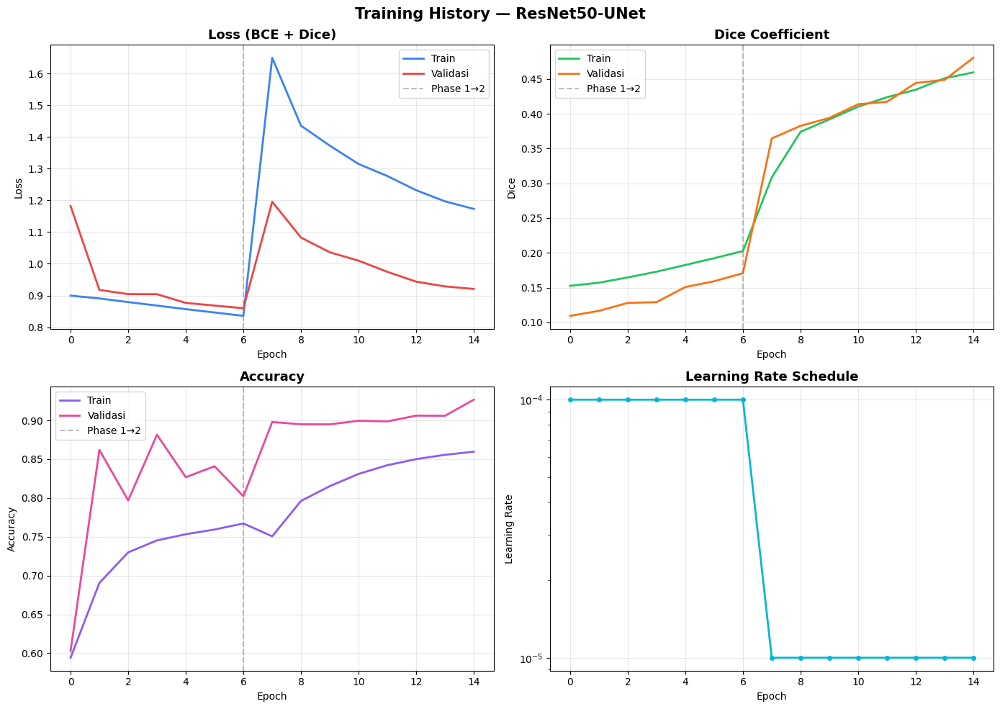

In [ ]:
# Gabungkan history
h = load_hist()
if not h or not h.get('loss'):
    print("Tidak ada training history. Belum training.")
else:
    total_epochs = len(h["loss"])
    print(f"Total epoch tersimpan: {total_epochs}")
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    # 1. Loss
    axes[0,0].plot(h["loss"], label="Train", color="#3b82f6", linewidth=2)
    axes[0,0].plot(h["val_loss"], label="Validasi", color="#ef4444", linewidth=2)
    axes[0,0].axvline(x=PHASE1_EPOCHS-1, color="gray", linestyle="--", alpha=0.5, label="Phase 1→2")
    axes[0,0].set_title("Loss (BCE + Dice)", fontsize=13, fontweight="bold")
    axes[0,0].set_xlabel("Epoch")
    axes[0,0].set_ylabel("Loss")
    axes[0,0].legend()
    axes[0,0].grid(alpha=0.3)
    # 2. Dice Coefficient
    axes[0,1].plot(h["dice_coef"], label="Train", color="#22c55e", linewidth=2)
    axes[0,1].plot(h["val_dice_coef"], label="Validasi", color="#f97316", linewidth=2)
    axes[0,1].axvline(x=PHASE1_EPOCHS-1, color="gray", linestyle="--", alpha=0.5, label="Phase 1→2")
    axes[0,1].set_title("Dice Coefficient", fontsize=13, fontweight="bold")
    axes[0,1].set_xlabel("Epoch")
    axes[0,1].set_ylabel("Dice")
    axes[0,1].legend()
    axes[0,1].grid(alpha=0.3)
    # 3. Accuracy
    axes[1,0].plot(h["accuracy"], label="Train", color="#8b5cf6", linewidth=2)
    axes[1,0].plot(h["val_accuracy"], label="Validasi", color="#ec4899", linewidth=2)
    axes[1,0].axvline(x=PHASE1_EPOCHS-1, color="gray", linestyle="--", alpha=0.5, label="Phase 1→2")
    axes[1,0].set_title("Accuracy", fontsize=13, fontweight="bold")
    axes[1,0].set_xlabel("Epoch")
    axes[1,0].set_ylabel("Accuracy")
    axes[1,0].legend()
    axes[1,0].grid(alpha=0.3)
    # 4. Learning Rate
    if "lr" in h:
        axes[1,1].plot(h["lr"], color="#06b6d4", linewidth=2, marker="o", markersize=4)
    else:
        lr_values = [LEARNING_RATE] * PHASE1_EPOCHS + [LEARNING_RATE/10] * (EPOCHS - PHASE1_EPOCHS)
        axes[1,1].plot(lr_values[:total_epochs], color="#06b6d4", linewidth=2, marker="o", markersize=4)
    axes[1,1].set_title("Learning Rate Schedule", fontsize=13, fontweight="bold")
    axes[1,1].set_xlabel("Epoch")
    axes[1,1].set_ylabel("Learning Rate")
    axes[1,1].set_yscale("log")
    axes[1,1].grid(alpha=0.3)
    plt.suptitle("Training History — ResNet50-UNet", fontsize=15, fontweight="bold")
    plt.tight_layout()
    plt.savefig("Training_History.png", dpi=150, bbox_inches="tight")
    plt.show()


In [48]:
best_model = tf.keras.models.load_model(
    MODEL_OUTPUT,
    custom_objects={
        "combined_loss": combined_loss,
        "weighted_bce_dice_loss": weighted_bce_dice_loss,
        "dice_coef": dice_coef
    }
)

In [49]:
# Kumpulkan prediksi untuk evaluasi
all_true, all_pred, all_pred_binary = [], [], []
for i in range(len(val_imgs)):
    img = cv2.imread(val_imgs[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE).astype(np.float32) / 255.0
    
    mask = cv2.imread(val_masks[i], cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    mask = (mask > 0).astype(np.float32)
    
    pred = best_model.predict(np.expand_dims(img, 0), verbose=0)[0, :, :, 0]
    
    all_true.append(mask.flatten())
    all_pred.append(pred.flatten())
    all_pred_binary.append((pred > 0.5).astype(np.float32).flatten())
y_true = np.concatenate(all_true)
y_pred_prob = np.concatenate(all_pred)
y_pred_bin = np.concatenate(all_pred_binary)
print(f"Total piksel evaluasi: {len(y_true):,}")
print(f"Piksel kerusakan     : {int(y_true.sum()):,} ({y_true.mean()*100:.2f}%)")

Total piksel evaluasi: 27,525,120
Piksel kerusakan     : 1,749,793 (6.36%)


In [50]:
from sklearn.metrics import precision_recall_curve, f1_score

sample_size = min(2_000_000, len(y_true))
idx = np.random.choice(len(y_true), sample_size, replace=False)
precisions, recalls, thresholds = precision_recall_curve(y_true[idx], y_pred_prob[idx])
f1_scores = 2 * (precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-8)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

In [51]:
y_pred_optimal = (y_pred_prob > optimal_threshold).astype(np.float32)
print(f"Classification Report (threshold = {optimal_threshold:.4f})")
print(classification_report(y_true, y_pred_optimal, target_names=["Non-Damage", "Damage"]))

Classification Report (threshold = 0.8465)
              precision    recall  f1-score   support

  Non-Damage       0.98      0.97      0.97  25775327
      Damage       0.61      0.74      0.67   1749793

    accuracy                           0.95  27525120
   macro avg       0.79      0.85      0.82  27525120
weighted avg       0.96      0.95      0.96  27525120



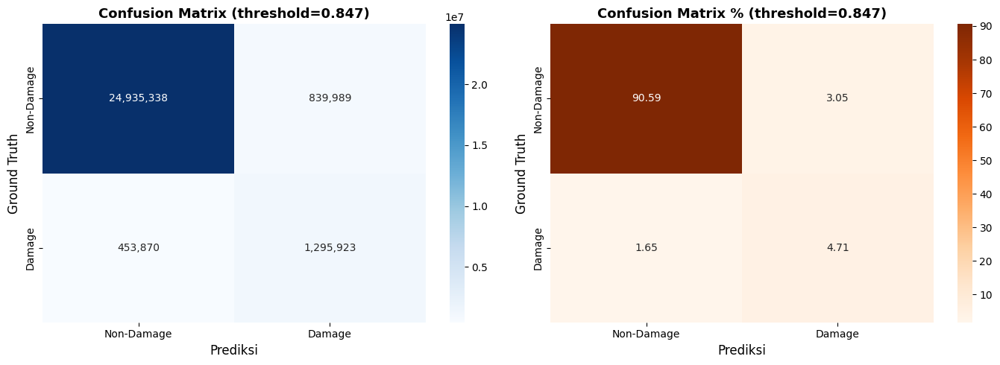

In [ ]:
cm_opt = confusion_matrix(y_true, y_pred_optimal)
cm_pct_opt = cm_opt.astype("float") / cm_opt.sum() * 100
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm_opt, annot=True, fmt=",d", cmap="Blues", ax=ax1,
            xticklabels=["Non-Damage", "Damage"],
            yticklabels=["Non-Damage", "Damage"])
ax1.set_xlabel("Prediksi", fontsize=12)
ax1.set_ylabel("Ground Truth", fontsize=12)
ax1.set_title(f"Confusion Matrix (threshold={optimal_threshold:.3f})", fontsize=13, fontweight="bold")
sns.heatmap(cm_pct_opt, annot=True, fmt=".2f", cmap="Oranges", ax=ax2,
            xticklabels=["Non-Damage", "Damage"],
            yticklabels=["Non-Damage", "Damage"])
ax2.set_xlabel("Prediksi", fontsize=12)
ax2.set_ylabel("Ground Truth", fontsize=12)
ax2.set_title(f"Confusion Matrix % (threshold={optimal_threshold:.3f})", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("Confusion_Matrix.png", dpi=150, bbox_inches="tight")
plt.show()

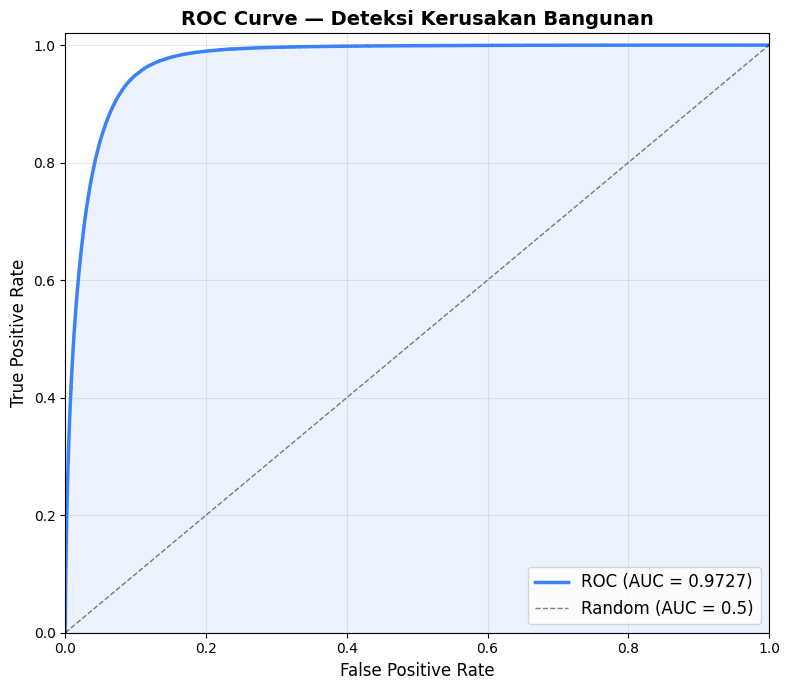

AUC Score: 0.9727


In [ ]:
# Subsample untuk kecepatan (piksel terlalu banyak)
sample_size = min(2_000_000, len(y_true))
idx = np.random.choice(len(y_true), sample_size, replace=False)

fpr, tpr, thresholds = roc_curve(y_true[idx], y_pred_prob[idx])
roc_auc = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(8, 7))
ax.plot(fpr, tpr, color="#3b82f6", linewidth=2.5, label=f"ROC (AUC = {roc_auc:.4f})")
ax.plot([0, 1], [0, 1], "k--", linewidth=1, alpha=0.5, label="Random (AUC = 0.5)")
ax.fill_between(fpr, tpr, alpha=0.1, color="#3b82f6")
ax.set_xlabel("False Positive Rate", fontsize=12)
ax.set_ylabel("True Positive Rate", fontsize=12)
ax.set_title("ROC Curve — Deteksi Kerusakan Bangunan", fontsize=14, fontweight="bold")
ax.legend(fontsize=12, loc="lower right")
ax.grid(alpha=0.3)
ax.set_xlim([0, 1])
ax.set_ylim([0, 1.02])

plt.tight_layout()
plt.savefig("ROC_Curve.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"AUC Score: {roc_auc:.4f}")

Threshold Optimization Results
Default threshold  : 0.5
Optimal threshold  : 0.8512
Best F1 Score      : 0.6677
Precision (optimal): 0.6107
Recall (optimal)   : 0.7364


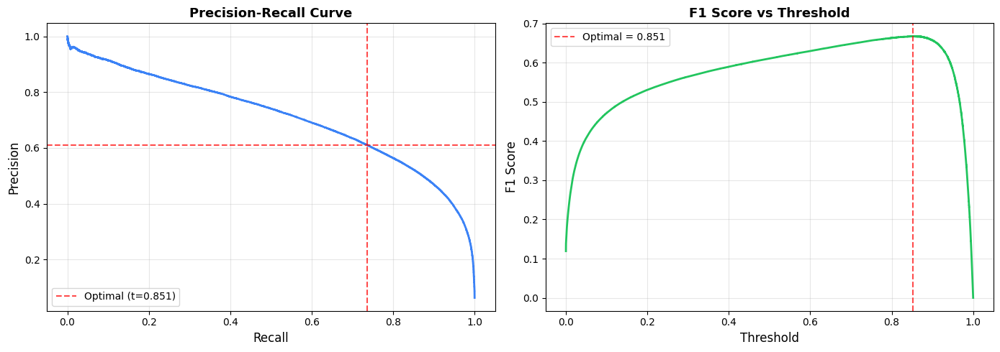

In [ ]:
from sklearn.metrics import precision_recall_curve

sample_size = min(2_000_000, len(y_true))
idx = np.random.choice(len(y_true), sample_size, replace=False)

precisions, recalls, thresholds = precision_recall_curve(y_true[idx], y_pred_prob[idx])

f1_scores = 2 * (precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-8)

optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"{'='*50}")
print(f"Optimal threshold  : {optimal_threshold:.4f}")
print(f"Best F1 Score      : {f1_scores[optimal_idx]:.4f}")
print(f"Precision (optimal): {precisions[optimal_idx]:.4f}")
print(f"Recall (optimal)   : {recalls[optimal_idx]:.4f}")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(recalls[:-1], precisions[:-1], color="#3b82f6", linewidth=2)
ax1.set_xlabel("Recall"); ax1.set_ylabel("Precision")
ax1.set_title("Precision-Recall Curve", fontweight="bold")
ax1.grid(alpha=0.3)

ax2.plot(thresholds, f1_scores, color="#22c55e", linewidth=2)
ax2.axvline(x=optimal_threshold, color="red", linestyle="--", label=f"Optimal = {optimal_threshold:.3f}")
ax2.set_xlabel("Threshold"); ax2.set_ylabel("F1 Score")
ax2.set_title("F1 vs Threshold", fontweight="bold")
ax2.legend(); ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig("Threshold_Optimization.png", dpi=150, bbox_inches="tight")
plt.show()

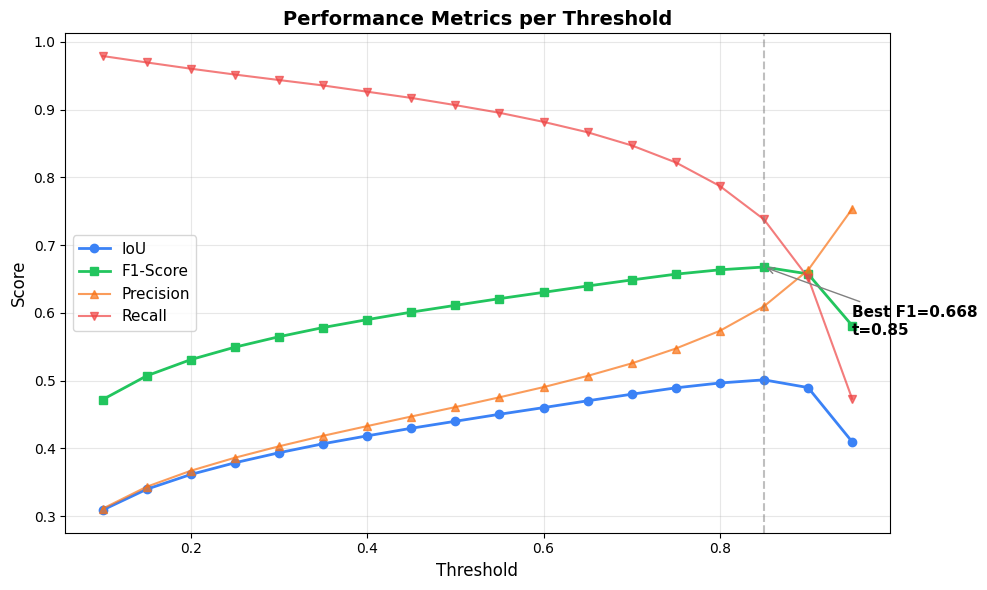

Best threshold: 0.85 (F1=0.6675, IoU=0.5010)


In [ ]:
thresholds_eval = np.arange(0.1, 1.0, 0.05)
ious, f1s, precisions_t, recalls_t = [], [], [], []

for t in thresholds_eval:
    pred_t = (y_pred_prob[idx] >= t).astype(np.float32)
    tp = ((pred_t == 1) & (y_true[idx] == 1)).sum()
    fp = ((pred_t == 1) & (y_true[idx] == 0)).sum()
    fn = ((pred_t == 0) & (y_true[idx] == 1)).sum()
    
    iou = tp / (tp + fp + fn + 1e-8)
    prec = tp / (tp + fp + 1e-8)
    rec = tp / (tp + fn + 1e-8)
    f1 = 2 * prec * rec / (prec + rec + 1e-8)
    
    ious.append(iou)
    f1s.append(f1)
    precisions_t.append(prec)
    recalls_t.append(rec)

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(thresholds_eval, ious, "o-", color="#3b82f6", linewidth=2, label="IoU")
ax.plot(thresholds_eval, f1s, "s-", color="#22c55e", linewidth=2, label="F1-Score")
ax.plot(thresholds_eval, precisions_t, "^-", color="#f97316", linewidth=1.5, alpha=0.7, label="Precision")
ax.plot(thresholds_eval, recalls_t, "v-", color="#ef4444", linewidth=1.5, alpha=0.7, label="Recall")

best_idx = np.argmax(f1s)
ax.axvline(x=thresholds_eval[best_idx], color="gray", linestyle="--", alpha=0.5)
ax.annotate(f"Best F1={f1s[best_idx]:.3f}\nt={thresholds_eval[best_idx]:.2f}",
            xy=(thresholds_eval[best_idx], f1s[best_idx]),
            xytext=(thresholds_eval[best_idx]+0.1, f1s[best_idx]-0.1),
            arrowprops=dict(arrowstyle="->", color="gray"),
            fontsize=11, fontweight="bold")

ax.set_xlabel("Threshold", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_title("Performance Metrics per Threshold", fontsize=14, fontweight="bold")
ax.legend(fontsize=11)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig("Threshold_Analysis.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Best threshold: {thresholds_eval[best_idx]:.2f} (F1={f1s[best_idx]:.4f}, IoU={ious[best_idx]:.4f})")

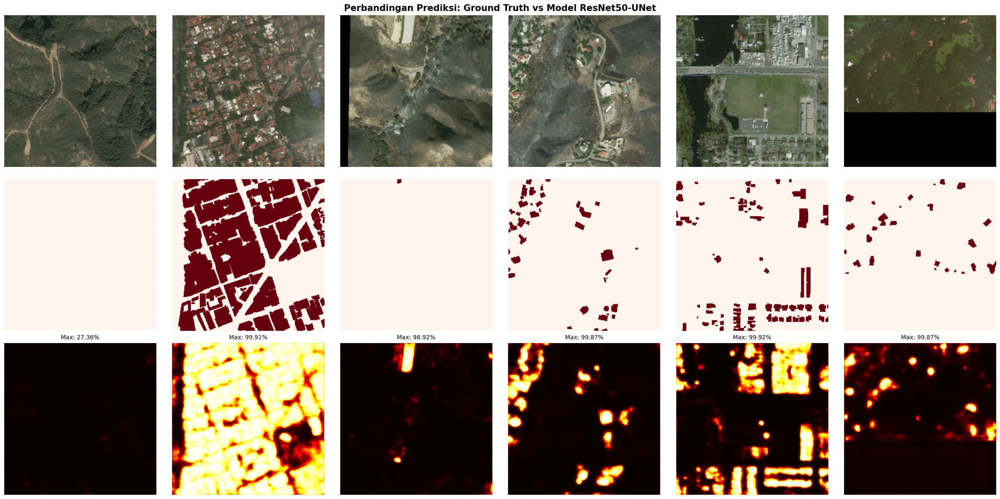

In [ ]:
sample_indices = np.random.choice(len(val_imgs), 6, replace=False)

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
row_labels = ["Citra Satelit", "Ground Truth", "Prediksi Model"]

for col, idx in enumerate(sample_indices):
    img = cv2.imread(val_imgs[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_r = cv2.resize(img, IMG_SIZE).astype(np.float32) / 255.0
    
    true_mask = cv2.imread(val_masks[idx], cv2.IMREAD_GRAYSCALE)
    true_mask = cv2.resize(true_mask, IMG_SIZE)
    true_mask = (true_mask > 0).astype(np.float32)
    
    pred_mask = best_model.predict(np.expand_dims(img_r, 0), verbose=0)[0, :, :, 0]
    
    axes[0, col].imshow(img_r)
    axes[0, col].axis("off")
    
    axes[1, col].imshow(true_mask, cmap="Reds", vmin=0, vmax=1)
    axes[1, col].axis("off")
    
    axes[2, col].imshow(pred_mask, cmap="hot", vmin=0, vmax=1)
    axes[2, col].set_title(f"Max: {pred_mask.max():.2%}", fontsize=10)
    axes[2, col].axis("off")

for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=13, fontweight="bold", rotation=90, labelpad=15)

plt.suptitle("Perbandingan Prediksi: Ground Truth vs Model ResNet50-UNet",
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("Prediction_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

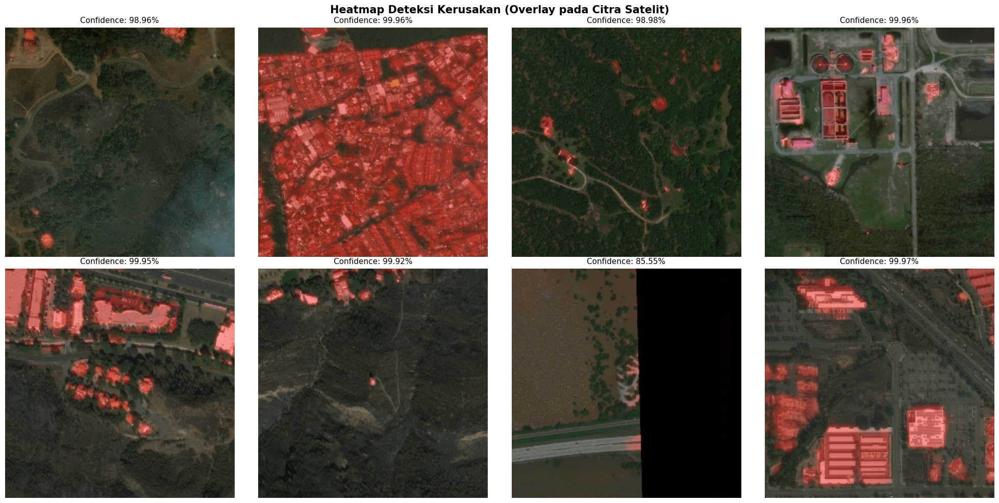

In [57]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
sample_8 = np.random.choice(len(val_imgs), 8, replace=False)

for i, idx in enumerate(sample_8):
    row, col = i // 4, i % 4
    
    img = cv2.imread(val_imgs[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_r = cv2.resize(img, IMG_SIZE).astype(np.float32) / 255.0
    
    pred = best_model.predict(np.expand_dims(img_r, 0), verbose=0)[0, :, :, 0]
    
    # Overlay: merah = kerusakan terdeteksi
    overlay = img_r.copy()
    mask_rgb = np.zeros_like(overlay)
    mask_rgb[:, :, 0] = pred  # Channel merah
    overlay = overlay * 0.6 + mask_rgb * 0.4
    overlay = np.clip(overlay, 0, 1)
    
    axes[row, col].imshow(overlay)
    axes[row, col].set_title(f"Confidence: {pred.max():.2%}", fontsize=11)
    axes[row, col].axis("off")

plt.suptitle("Heatmap Deteksi Kerusakan (Overlay pada Citra Satelit)",
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("Overlay_Heatmap.png", dpi=150, bbox_inches="tight")
plt.show()